# Detector de turbinas eólicas

### Descarga ultralytics y carga de bibliotecas a utilizar

In [3]:
!pip install ultralytics


In [5]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os
import random
import pandas as pd
import matplotlib.image as mpimg
import torch
import tensorflow as tf
import pathlib

### Primer paso: subir dataset desde gitlab (repo mio)

In [ ]:
dataset_url = "https://gitlab.com/utn944026/wind_turbines/-/raw/main/turbinas.zip?inline=false"
data_dir = tf.keras.utils.get_file(origin=dataset_url, extract=True)
data_dir = pathlib.Path(data_dir).with_suffix('')
print (data_dir)


646940251/646940251 [==============================] - 7s 0us/step
/root/.keras/datasets/turbinas


In [ ]:
!ls /root/.keras/datasets/


turbinas  turbinas.zip


### Segundo paso: Creación del dataset y visualización de los datos

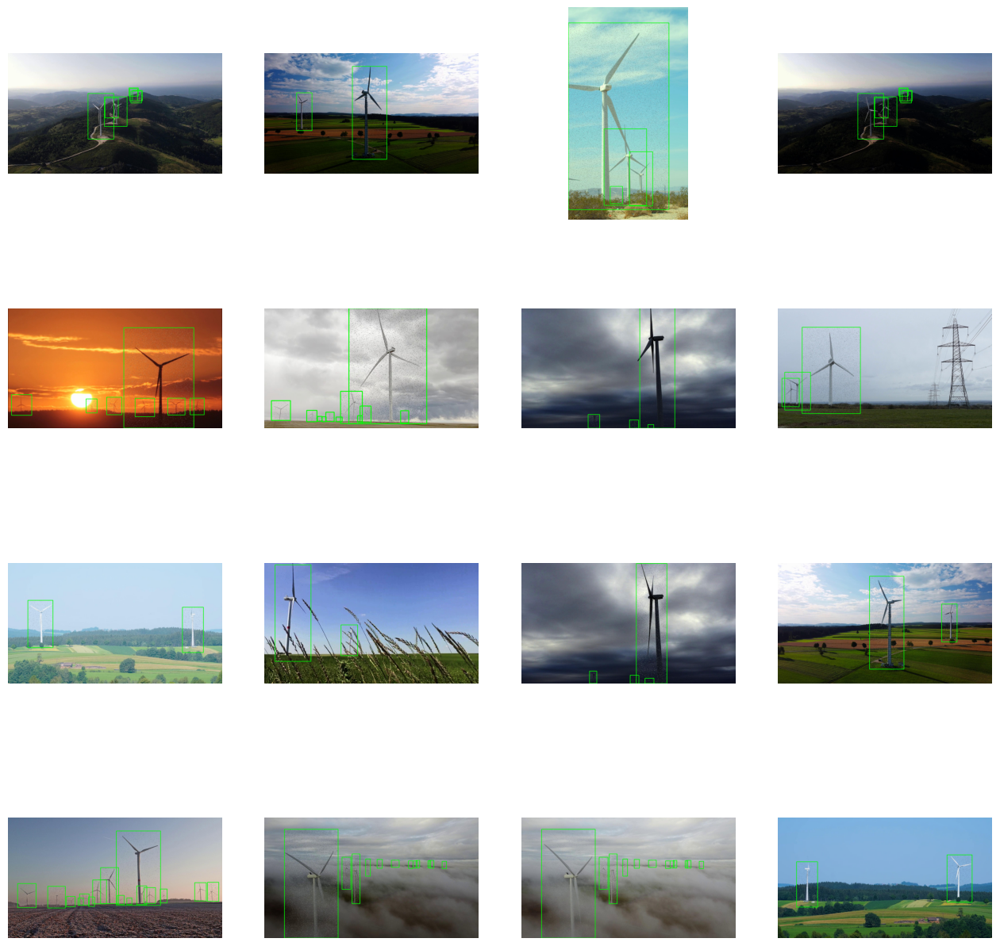

In [ ]:
train_images = "/root/.keras/datasets/turbinas/train/images"
train_labels = "/root/.keras/datasets/turbinas/train/labels"

test_images = "/root/.keras/datasets/turbinas/test/images"
test_labels = "/root/.keras/datasets/turbinas/labels"

val_images = "/root/.keras/datasets/turbinas/images"
val_labels = "/root/.keras/datasets/turbinas/labels"

# Lista de todos los archivos de imagen en el directorio de imágenes de entrenamiento
image_files = os.listdir(train_images)

# Agarrar 16 imagenes random del directorio
random_images = random.sample(image_files, 16)

fig, axs = plt.subplots(4, 4, figsize=(16, 16))

# plot
for i, image_file in enumerate(random_images):
    row = i // 4
    col = i % 4

    # Carga imagen
    image_path = os.path.join(train_images, image_file)
    image = cv2.imread(image_path)

    # Carga etiquetas para la imagen
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(train_labels, label_file)
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")

    for label in labels:
        if len(label.split()) != 5:
            continue
        class_id, x_center, y_center, width, height = map(float, label.split())
        x_min = int((x_center - width/2) * image.shape[1])
        y_min = int((y_center - height/2) * image.shape[0])
        x_max = int((x_center + width/2) * image.shape[1])
        y_max = int((y_center + height/2) * image.shape[0])
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 3)


    # Muestra de las imagenes
    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.show()

In [ ]:
random_image_pick = random.sample(image_files, 1)
random_image_path = os.path.join(train_images, random_image_pick[0])
random_image = cv2.imread(random_image_path)
print (random_image.shape)
height, width, channels = random_image.shape


(1080, 1920, 3)


### Tercer paso: Carga de modelo pre-entrenado y entrenamiento con nuevos datos


In [ ]:
model = YOLO('yolov8n.pt')

data_path = '/root/.keras/datasets/turbinas/data.yaml'

# Training the model
model.train(data = data_path,
            epochs = 5,
            imgsz = (height, width, channels),
            seed = 42,
            batch = 1)

100%|██████████| 6.23M/6.23M [00:00<00:00, 22.6MB/s]
Ultralytics YOLOv8.0.126 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/root/.keras/datasets/turbinas/data.yaml, epochs=5, patience=50, batch=1, imgsz=(1080, 1920, 3), save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, b

### Rendimiento del modelo
A continuación se lleva a cabo un análisis de las métricas en la evaluación y determinación del rendimiento del modelo YOLO v8.

#### 1. Train Box Loss
La métrica "train box loss" representada como "box_loss" mide la diferencia entre el cuadro o caja que predice el modelo y el cuadro real del objeto en los datos de entrenamiento. Cuanto más bajo sea este parámetro, es decir cuanto mas bajo sea la perdida, los cuadros estarán más alineados con el cuadro real a predecir. Es básicamente lo mismo que IoU (Intersection over Union):
![IoU](https://find1dream.github.io/assets/img/ML/boundingbox/iou_meaning.png)
#### 2. Train Class Loss
La métrica "train class loss" representada como "cls_loss" mide la diferencia entre la probabilidad de clase que el modelo predice y la etiqueta real de la clase del objeto en los datos de entrenamiento. Cuanto menor sea la perdida, significa que la clase que el modelo predice se acerca más a la etiqueta real de la clase.
#### 3. DFL Loss
Las características son representaciones abstractas de los datos que se extraen de capas intermedias de una red neuronal. Estas características son fundamentales para el rendimiento y la generalización del modelo en diversas tareas. Sin embargo, en muchos casos, es difícil diseñar manualmente características relevantes para un problema específico. Dynamic Feature Learning (DFL) es un enfoque que busca mejorar el rendimiento del modelo al permitir que aprenda características de manera dinámica y adaptable a medida que se presentan nuevos datos.

La métrica "DFL Loss" representada como "dfl_loss" mide la diferencia entre los mapas de características que el modelo predice y los mapas de características reales de los objetos en los datos de entrenamiento.

#### 4. Precision
La métrica de "precisión", representada como "p" mide la proporción de detecciones positivas verdaderas entre todos los cuadros predichos. Una mayor precisión significa que el modelo es mejor para identificar correctamente las detecciones positivas verdaderas y minimizar los falsos positivos.

De todos los positivos pronosticados, ¿qué porcentaje es realmente positivo?

![](https://miro.medium.com/v2/resize:fit:414/format:webp/1*tHf0NHWGMwZTNe7TkylyYA.png)

#### 5. Recall
La métrica de "recall", representada como "r" mide la proporción de detecciones positivas verdaderas entre todos los cuadros reales. Un mayor recall significa que el modelo es mejor para identificar correctamente todas las detecciones positivas verdaderas y minimizar los falsos negativos.

Del total de positivos, ¿qué porcentaje se pronostican positivos? Es lo mismo que TPR (tasa positiva verdadera).

![](https://miro.medium.com/v2/resize:fit:444/format:webp/1*ynGz0zu8ZlpgZ5voYRKfLg.png)


#### 6. mAP50
La métrica mAP50 mide la precisión promedio media del modelo en diferentes categorías de objetos, con un umbral de IoU del 50 %. Un mAP50 más alto significa que el modelo es mejor para detectar y localizar con precisión objetos en diferentes categorías.

#### 7. mAP50-95
La métrica mAP50-95 mide la precisión promedio del modelo en diferentes categorías de objetos, con umbrales de IoU que van del 50 % al 95 %. Un mAP50-95 más alto significa que el modelo es mejor para detectar y localizar con precisión objetos en diferentes categorías con una gama más amplia de umbrales de IoU.

#### 8. Matriz de confusión
La matriz de confusión es una tabla que resume las predicciones positivas verdaderas, negativas verdaderas, positivas falsas y negativas falsas realizadas por el modelo. Se puede utilizar para calcular varias métricas de rendimiento como precisión, recuperación y puntuación F1. Para una clasificación binaria se tiene:

![MC](https://miro.medium.com/v2/resize:fit:640/format:webp/1*UsOWxGhFMhkfkFZivPFlpQ.png).

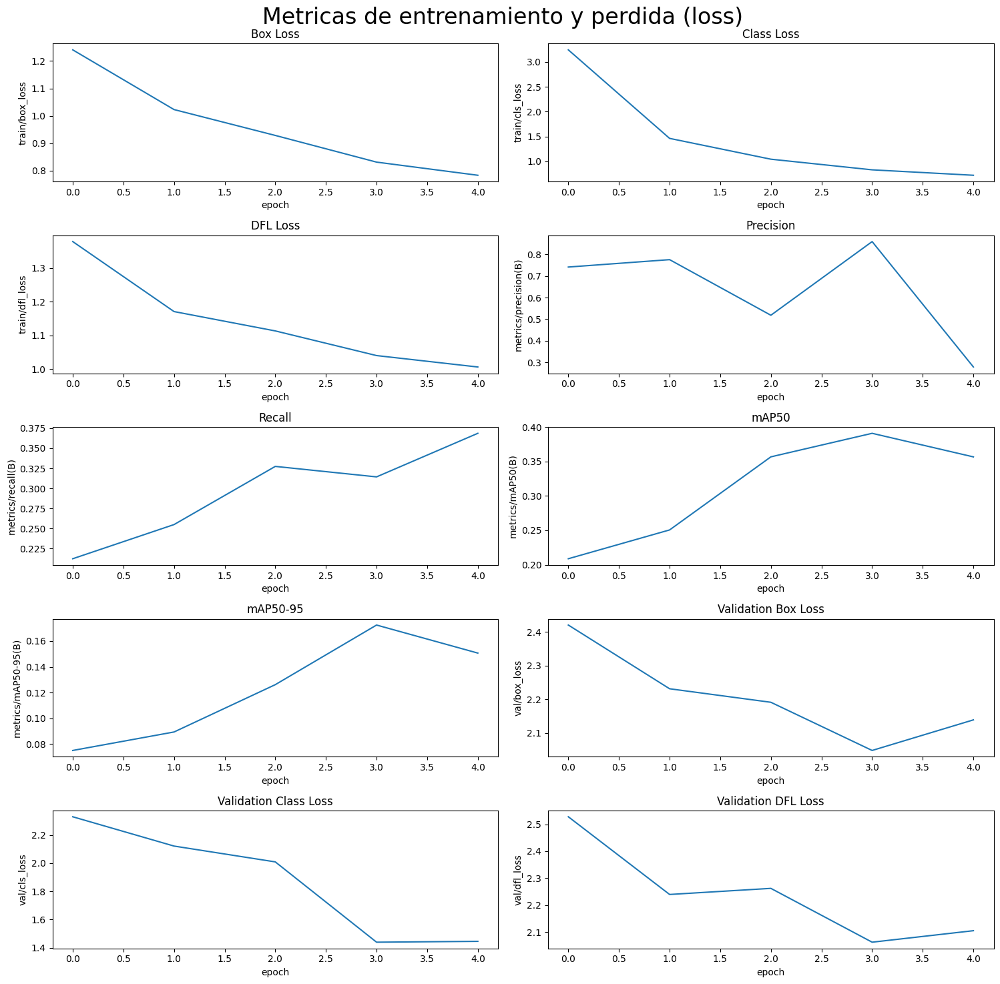

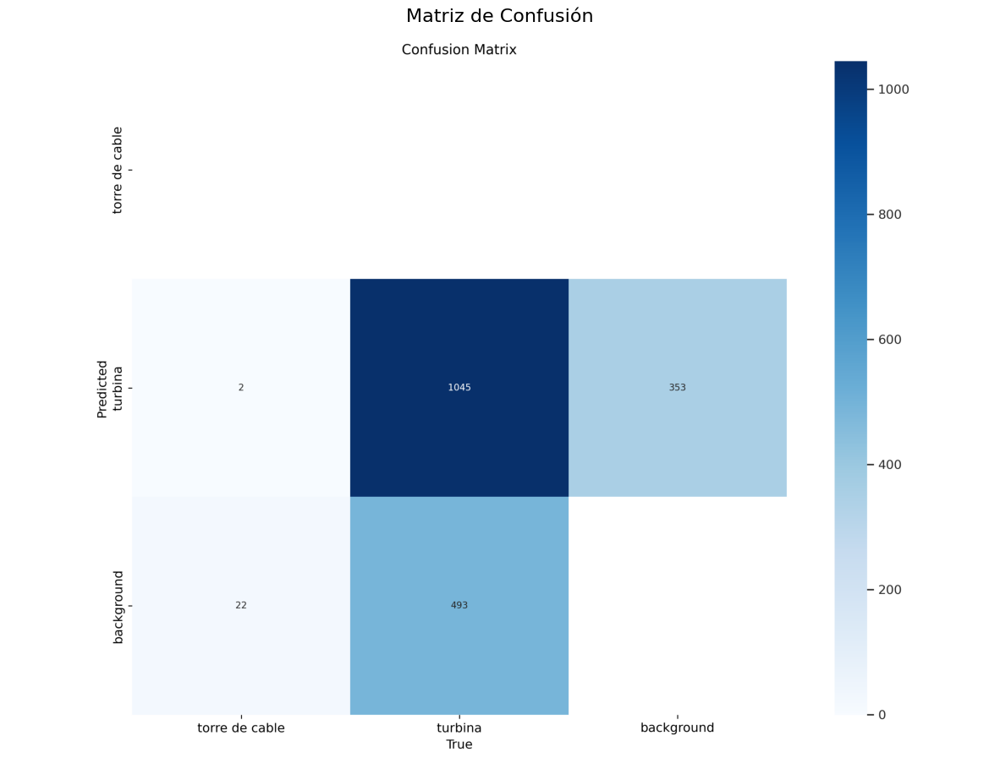

In [ ]:
%matplotlib inline
# read in the results.csv file as a pandas dataframe
df = pd.read_csv('/content/runs/detect/train/results.csv')
df.columns = df.columns.str.strip()

fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

axs[0,0].set(title='Box Loss')
axs[0,1].set(title='Class Loss')
axs[1,0].set(title='DFL Loss')
axs[1,1].set(title='Precision')
axs[2,0].set(title='Recall')
axs[2,1].set(title='mAP50')
axs[3,0].set(title='mAP50-95')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

plt.suptitle('Metricas de entrenamiento y perdida (loss)', fontsize=24)

plt.subplots_adjust(top=0.8)

plt.tight_layout()


fig, ax_img = plt.subplots(figsize=(15, 15))
ax_img.imshow(plt.imread('/content/runs/detect/train/confusion_matrix.png'))
ax_img.axis('off')
ax_img.set_title('Matriz de Confusión', fontsize=16)

plt.show()


### Prueba del modelo

Vamos a probar el modelo con el parque Eólico Arauco en La Rioja:

47426/47426 [==============================] - 0s 0us/step



0: 1312x1920 1 turbina, 82.0ms
Speed: 11.4ms preprocess, 82.0ms inference, 1.9ms postprocess per image at shape (1, 3, 1312, 1920)


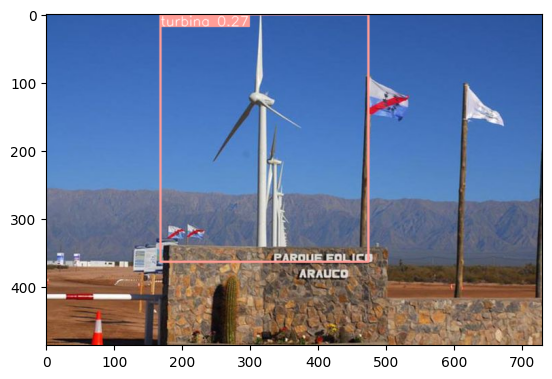

In [ ]:
arauco_url = "https://media.lmneuquen.com/p/c0a3736bee14906ab9f9b2f31901a9a1/adjuntos/242/imagenes/007/263/0007263109/730x0/smart/parque-eolico-arauco-la-rioja-energia-renovablejpg.jpg"
arauco_dir = tf.keras.utils.get_file(origin=arauco_url)
img = cv2.imread(arauco_dir)
detect_result = model(img)
detect_img = detect_result[0].plot()
detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)
plt.imshow(detect_img)

Probamos con un video


In [9]:
video_url = "https://gitlab.com/utn944026/wind_turbines/-/raw/main/parque_arauco.mp4?inline=false"
video_dir = tf.keras.utils.get_file(origin=video_url)
model = YOLO('/content/runs/detect/train/weights/best.pt')

video_result = model(video_dir, save=True)




    WARNING ⚠️ stream/video/webcam/dir predict source will accumulate results in RAM unless `stream=True` is passed,
    causing potential out-of-memory errors for large sources or long-running streams/videos.

    Usage:
        results = model(source=..., stream=True)  # generator of Results objects
        for r in results:
            boxes = r.boxes  # Boxes object for bbox outputs
            masks = r.masks  # Masks object for segment masks outputs
            probs = r.probs  # Class probabilities for classification outputs

video 1/1 (1/903) /root/.keras/datasets/parque_arauco.mp4: 1088x1920 10 turbinas, 86.5ms
video 1/1 (2/903) /root/.keras/datasets/parque_arauco.mp4: 1088x1920 10 turbinas, 27.1ms
video 1/1 (3/903) /root/.keras/datasets/parque_arauco.mp4: 1088x1920 10 turbinas, 24.6ms
video 1/1 (4/903) /root/.keras/datasets/parque_arauco.mp4: 1088x1920 10 turbinas, 24.8ms
video 1/1 (5/903) /root/.keras/datasets/parque_arauco.mp4: 1088x1920 10 turbinas, 24.6ms
video 1/1 (6/9

In [10]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!ls runs/detect/predict4

!ffmpeg -i runs/detect/predict4/parque_arauco.avi runs/detect/predict4/parque_arauco.mp4


parque_arauco_fin.mp4
ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab 

In [12]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('runs/detect/predict4/parque_arauco.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML("""
<video controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

(Me parece que la notebook no levanta el video, lo adjunto en el repositorio.)

### Conclusiones

Se puede observar en el video que el modelo no es muy inteligente a la hora de detectar las turbinas que tienen cierta perspectiva y se encuentran muy lejos (las turbinas que se encuentran al fondo del video son muy dificiles de distinguir). Esto se debe a que el dataset utilizado para entrenar la red YOLOv8 tiene principalmente imágenes etiquetadas frontalmente y desde un ángulo muy bajo, ya que la mayoría son tomados a la altura de una persona. El video es filmado mediante un dron por lo que las imágenes están a una altura mayor a la de la turbina.

Probablemente si entrenaba la red con mas epochs, los parámetros de rendimiento hubieran aumentado significativamente. No pude hacerlo en colab porque me desconectaba después de las 10 epochs.